In [ ]:
import zipfile
from tqdm import tqdm
import numpy as np
import gzip
import tensorflow as tf


# The dataset 'img_align_celeba.zip' is downloaded from
# https://drive.google.com/drive/folders/0B7EVK8r0v71pTUZsaXdaSnZBZzg?resourcekey=0-rJlzl934LzC-Xp28GeIBzQ
with zipfile.ZipFile('img_align_celeba.zip', 'r') as file:
    image_files = [f.filename for f in file.filelist if (not f.is_dir()) and f.filename.endswith('.jpg')]
    X_train = np.empty([len(image_files),45,45,3],dtype='uint8')
    for i, filename in enumerate(tqdm(image_files)):
        X_train[i] = tf.io.decode_and_crop_jpeg(file.read(filename),
                                                crop_window=[5,0,45,45],
                                                ratio=4,
                                                channels=3).numpy()
X_train = X_train.squeeze()
with gzip.GzipFile('celeba_gray_45x45x3.npy.gz','wb',5) as save_file:
    np.save(save_file, X_train)

100%|████████████████████████████████████████████████████████████████████████| 202599/202599 [00:44<00:00, 4554.96it/s]


## Load previously prepared data

In [ ]:
import numpy as np
import gzip

with gzip.GzipFile('celeba_gray_45x45x3.npy.gz','rb') as save_file:
    X_train = np.load(save_file)
X_train = X_train.astype('float32')/255.

### View collage of images

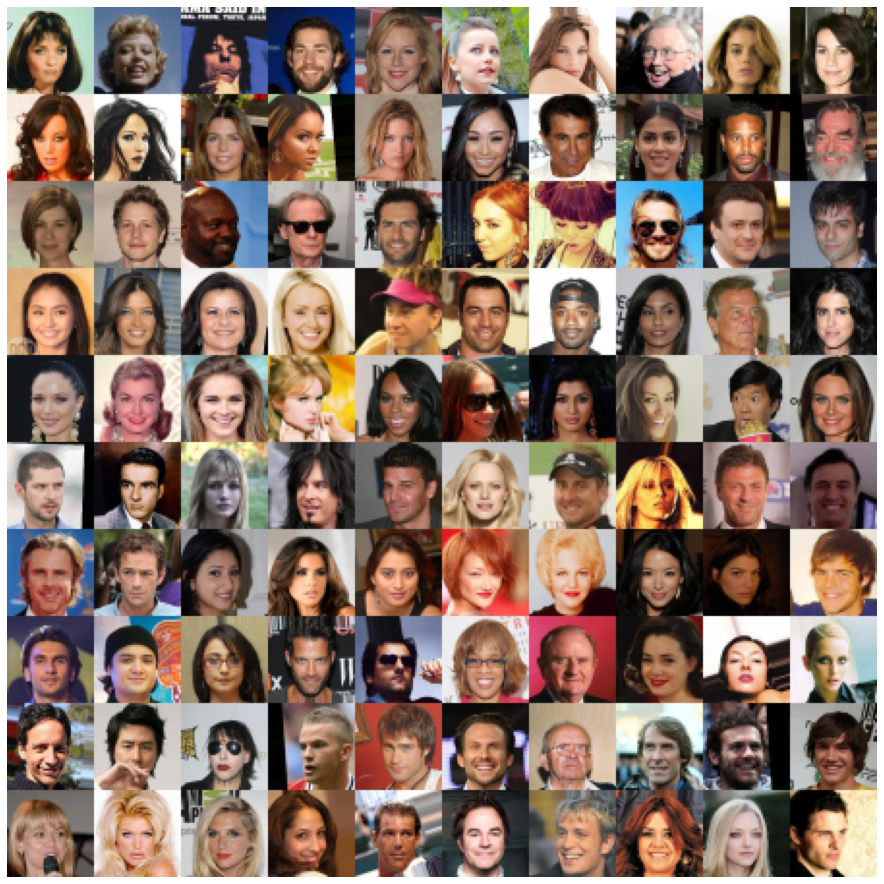

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(16,16))
plt.imshow(X_train[600:700].reshape(10,10,45,45,3).transpose(0,2,1,3,4).reshape(450,450,3))
plt.axis('off')
plt.show()

# GAN

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, losses, optimizers, metrics, initializers

latent_dim = 512

def get_discriminator():
    inp = layers.Input(shape=[45,45,3],name='input')
    x = inp

    x = layers.Conv2D(512, (4,4), padding='valid', name='base_conv')(x)
    # x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2, name='block1_activ1')(x)
    x = layers.Conv2D(512, (4,4), padding='same',
                      strides=(2,2),
                      name='block1_conv2')(x)
    # x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2, name='block2_activ1')(x)

    # Second Conv block
    x = layers.ZeroPadding2D([(0,1),(0,1)], name='zero_padding1')(x)
    x = layers.Conv2D(512, (4,4), padding='same',
                      strides=(2,2),
                      name='block2_conv2')(x)
    # x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2, name='block3_activ1')(x)

    # Third Conv block
    x = layers.ZeroPadding2D([(0,1),(0,1)], name='zero_padding2')(x)
    x = layers.Conv2D(512, (4,4), padding='same',
                      strides=(2,2),
                      name='block3_conv2')(x)
    # x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2, name='final_activ')(x)

    # x = layers.Flatten(name='flatten')(x)
    x = layers.GlobalAveragePooling2D()(x)
    # x = layers.Dense(512, activation='elu', name='final_dense')(x)
    outp = layers.Dense(1, name='final_dense')(x)

    model = models.Model(inp, outp, name='discriminator_model')
    return model


def get_generator():
    inp = layers.Input([latent_dim],name='input')
    x = inp

    # x = layers.Dense(512, activation='elu', name='dense1')(x)
    x = layers.Dense(6*6*512, name='dense2')(x)
    x = layers.LeakyReLU(alpha=0.2, name='block1_activ1')(x)
    x = layers.Reshape([6,6,512], name='reshape')(x)

    # First Conv Block
    x = layers.Conv2DTranspose(512, (4,4), padding='same', 
                      strides=(2,2),
                      name='block1_conv1')(x)
    # x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2, name='block2_activ1')(x)

    # Second Conv Block
    x = layers.Cropping2D([(0,1),(0,1)], name='cropping2')(x)
    x = layers.Conv2DTranspose(512, (4,4), padding='same', 
                      strides=(2,2),
                      name='block2_conv1')(x)
    # x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2, name='block2_activ2')(x)

    # Third Conv Block
    x = layers.Cropping2D([(0,1),(0,1)], name='cropping3')(x)
    x = layers.Conv2DTranspose(512, (4,4), padding='same', 
                               strides=(2,2),
                               name='block3_conv1')(x)
    # x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2, name='block3_activ2')(x)
    x = layers.Conv2DTranspose(3, (4,4), padding='valid', 
                               activation='sigmoid', name='final_conv')(x)
    
    outp = x
    model = models.Model(inp, outp, name='generator_model')
    return model

In [ ]:
import numpy as np

batch_size = 32

indices = np.arange(X_train.shape[0], dtype=int)
np.random.shuffle(indices)
train_dataset = tf.data.Dataset.from_tensor_slices(X_train[indices]).shuffle(10000).batch(batch_size).prefetch(-1)

In [ ]:
strategy = tf.distribute.MirroredStrategy()
train_dataset = strategy.experimental_distribute_dataset(train_dataset)

with strategy.scope():
    generator_model = get_generator()
    discriminator_model = get_discriminator()

    gen_optim = optimizers.Adam(learning_rate=1e-4)
    gen_loss = losses.BinaryCrossentropy(from_logits=True, 
                                         reduction=losses.Reduction.NONE,
                                         name='gen_loss')
    # gen_loss = losses.MeanSquaredError(reduction=losses.Reduction.NONE, name='gen_loss')
    gen_acc = metrics.BinaryAccuracy(name='gen_acc',threshold=0.)

    disc_optim = optimizers.Adam(learning_rate=1e-4)
    disc_loss = losses.BinaryCrossentropy(from_logits=True,
                                          reduction=losses.Reduction.NONE,
                                        #   label_smoothing=0.1,
                                           name='disc_loss')
    # disc_loss = losses.MeanSquaredError(reduction=losses.Reduction.NONE, name='disc_loss')
    disc_acc = metrics.BinaryAccuracy(name='disc_acc',threshold=0.)

    gen_loss_mean = metrics.Mean(name='gen_loss_mean')
    disc_loss_mean = metrics.Mean(name='disc_loss_mean')

    def compute_gen_loss(y_true, y_pred):
        return tf.nn.compute_average_loss(gen_loss(y_true, y_pred),
                                          global_batch_size=batch_size)
    
    def compute_disc_loss(y_true, y_pred):
        return tf.nn.compute_average_loss(disc_loss(y_true, y_pred),
                                          global_batch_size=batch_size)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2', '/job:localhost/replica:0/task:0/device:GPU:3', '/job:localhost/replica:0/task:0/device:GPU:4', '/job:localhost/replica:0/task:0/device:GPU:5', '/job:localhost/replica:0/task:0/device:GPU:6', '/job:localhost/replica:0/task:0/device:GPU:7')


In [ ]:
@tf.function
def gan_train_step(batch):
    bsize = tf.shape(batch)[0]
    zero_labels = tf.zeros([bsize,1],dtype=batch.dtype)
    one_labels = tf.ones([bsize,1],dtype=batch.dtype)

    # Generator
    gen_labels = one_labels
    noise = tf.random.normal([bsize,latent_dim])
    
    with tf.GradientTape(watch_accessed_variables=False) as tape:
        tape.watch(generator_model.trainable_weights)
        generated = generator_model(noise, training=True)
        predictions = discriminator_model(generated, training=False)
        loss = compute_gen_loss(gen_labels, predictions)

    grads = tape.gradient(loss, generator_model.trainable_weights)
    gen_optim.apply_gradients(zip(grads, generator_model.trainable_weights))
    gen_acc.update_state(gen_labels, predictions)
    gen_loss_mean.update_state(loss)

    # Discriminator
    disc_real_labels = tf.concat([zero_labels,one_labels],axis=0)
    disc_labels = tf.concat([zero_labels+0.1*tf.random.uniform(tf.shape(zero_labels)),
                             one_labels-0.1*tf.random.uniform(tf.shape(one_labels))],axis=0)
    # disc_labels = disc_real_labels + 0.05*tf.random.uniform(tf.shape(disc_real_labels))
    new_noise = tf.random.normal([bsize,latent_dim])
    fakes = generator_model(new_noise, training=False)
    disc_inp = tf.concat([fakes,batch],axis=0)

    with tf.GradientTape(watch_accessed_variables=False) as tape:
        tape.watch(discriminator_model.trainable_weights)
        predictions = discriminator_model(disc_inp, training=True)
        loss = compute_disc_loss(disc_labels, predictions)
    
    grads = tape.gradient(loss, discriminator_model.trainable_weights)
    disc_optim.apply_gradients(zip(grads, discriminator_model.trainable_weights))
    disc_acc.update_state(disc_real_labels,predictions)
    disc_loss_mean.update_state(loss)

In [ ]:
from tqdm import tqdm


class Training:
    def update_progbar(self):
        self.progbar.set_description('Training: '+' ; '.join([
            f'gen_loss:{gen_loss_mean.result().numpy():0.5f}', 
            f'gen_acc:{gen_acc.result().numpy():0.3%}',
            f'disc_loss:{disc_loss_mean.result().numpy():0.5f}',
            f'disc_acc:{disc_acc.result().numpy():0.3%}'
        ]))
        self.progbar.update()
    
    @tf.function
    def training_loop(self):
        for batch in train_dataset:
            strategy.experimental_run_v2(gan_train_step,(batch,))
            tf.py_function(self.update_progbar, [], [])

    def train_epoch(self):
        gen_loss_mean.reset_states()
        gen_acc.reset_states()
        disc_loss_mean.reset_states()
        disc_acc.reset_states()

        self.progbar = tqdm(total=(len(X_train)+batch_size-1)//batch_size)
        try:
            self.training_loop()
        finally:
            self.progbar.close()

    def plot_samples(self):
        noise = np.random.randn(100,latent_dim)
        generated = generator_model.predict_on_batch(noise).numpy()
        plt.figure(figsize=[16,16])
        plt.imshow(generated.reshape(10,10,45,45,3).transpose(0,2,1,3,4).reshape(450,450,3))
        plt.axis('off')
        plt.show()
        plt.pause(0.01)

    def train(self,num_epochs):
        for epoch in range(num_epochs):
            print(f'Epoch {epoch+1}/{num_epochs}:',flush=True)
            self.train_epoch()
            generator_model.save_weights('generator_weights.h5')
            discriminator_model.save_weights('discriminator_weights.h5')
            self.plot_samples()

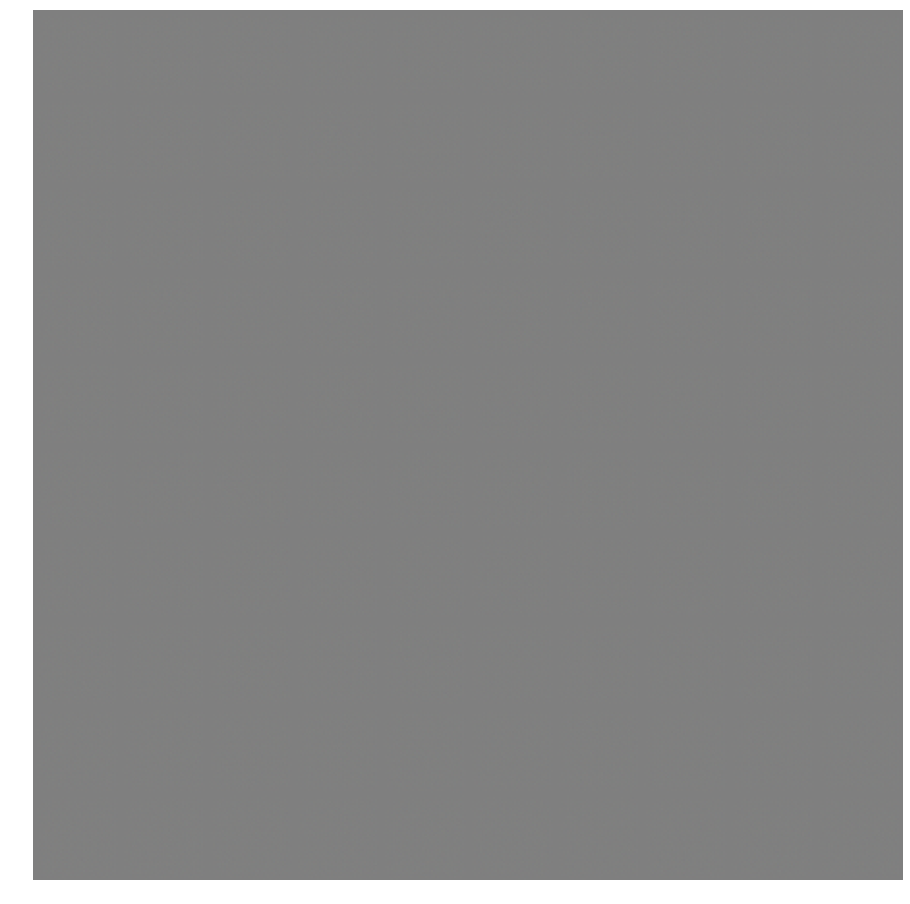

Epoch 1/200:


Training: gen_loss:0.32032 ; gen_acc:18.122% ; disc_loss:0.20353 ; disc_acc:75.716%: 100%|██████████| 6332/6332 [06:59<00:00, 15.10it/s]


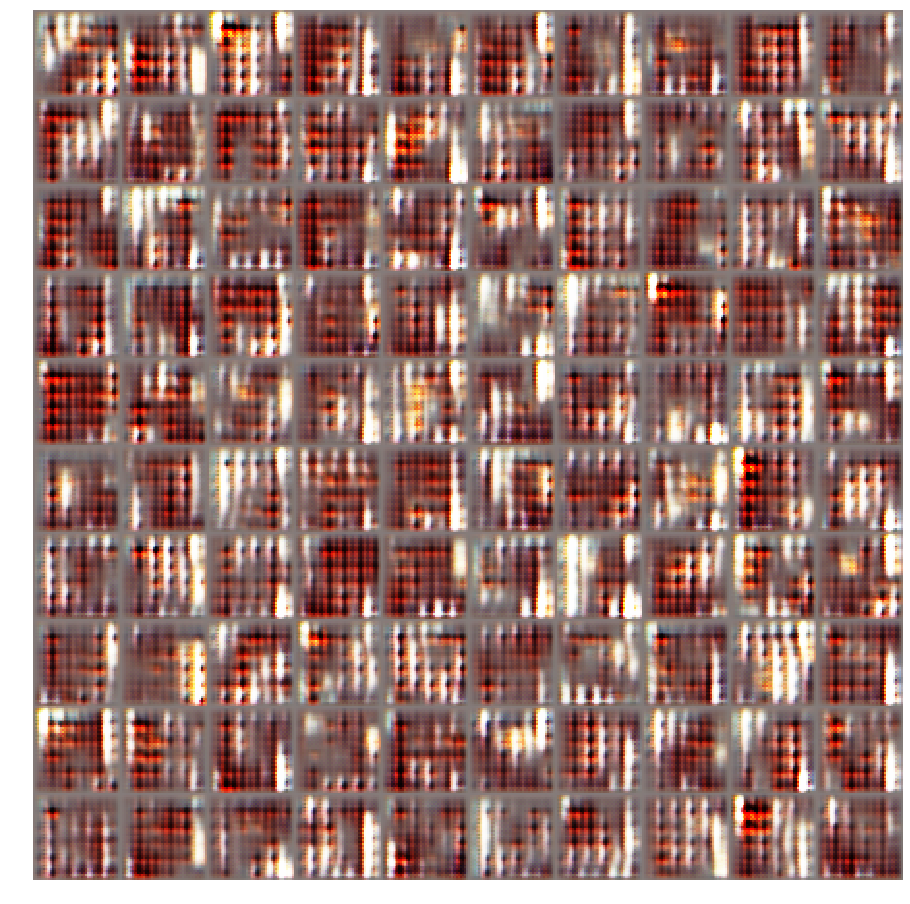

Epoch 2/200:


Training: gen_loss:0.21275 ; gen_acc:22.982% ; disc_loss:0.23757 ; disc_acc:68.479%: 100%|██████████| 6332/6332 [06:46<00:00, 15.57it/s]


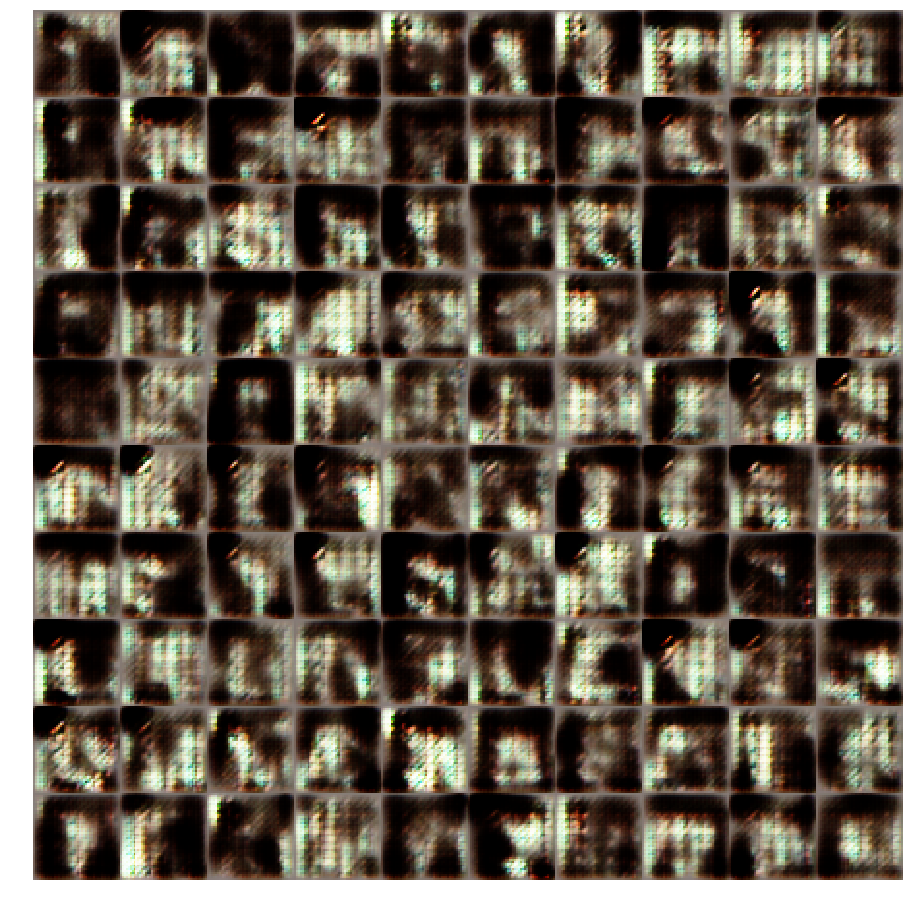

Epoch 3/200:


Training: gen_loss:0.18115 ; gen_acc:28.716% ; disc_loss:0.24626 ; disc_acc:63.685%: 100%|██████████| 6332/6332 [06:46<00:00, 15.56it/s]


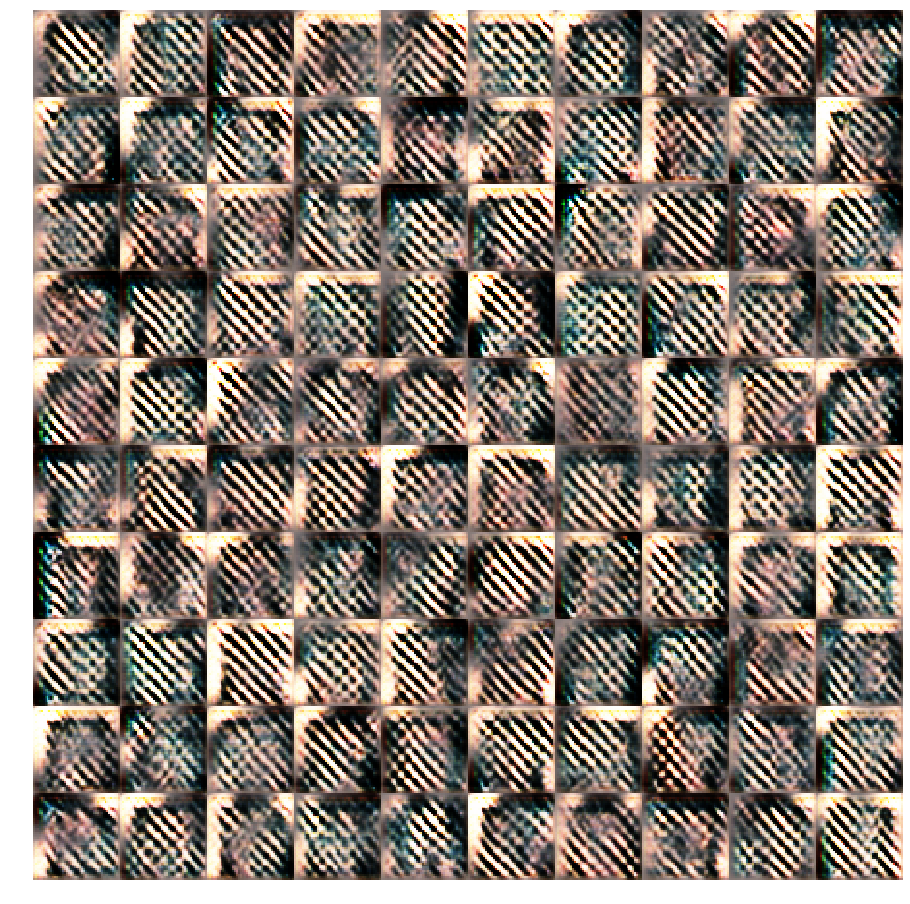

Epoch 4/200:


Training: gen_loss:0.16210 ; gen_acc:32.752% ; disc_loss:0.25487 ; disc_acc:60.671%: 100%|██████████| 6332/6332 [06:46<00:00, 15.58it/s]


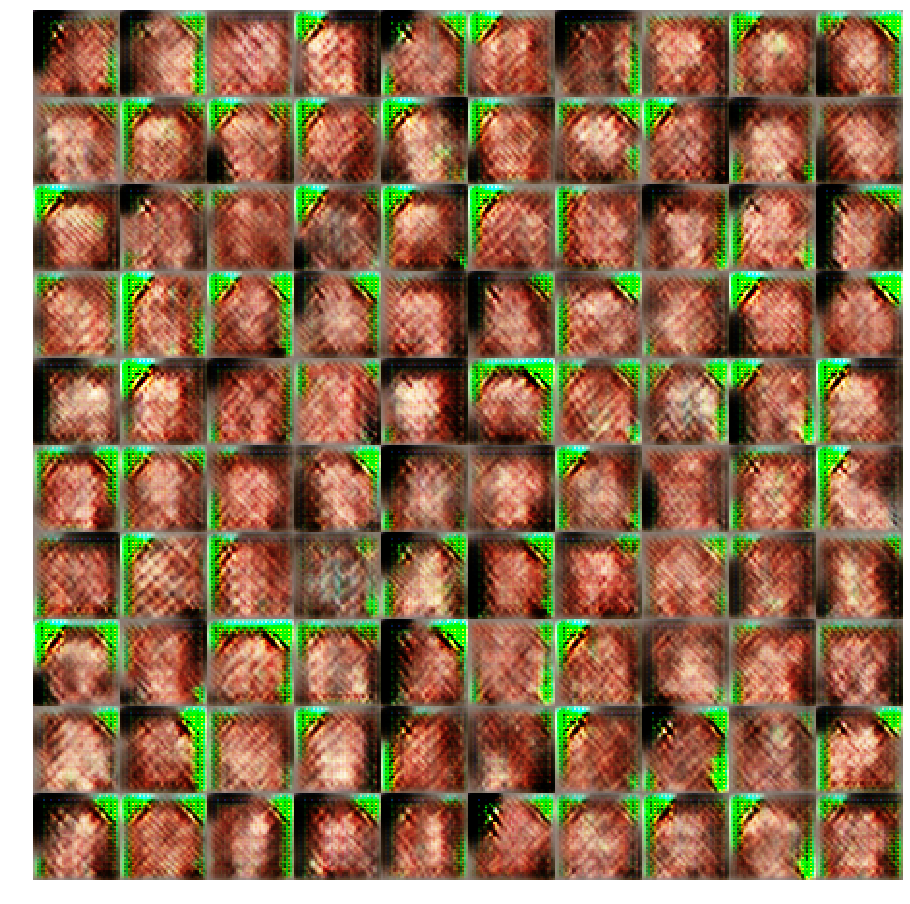

Epoch 5/200:


Training: gen_loss:0.16226 ; gen_acc:33.970% ; disc_loss:0.25492 ; disc_acc:60.250%: 100%|██████████| 6332/6332 [06:43<00:00, 15.68it/s]


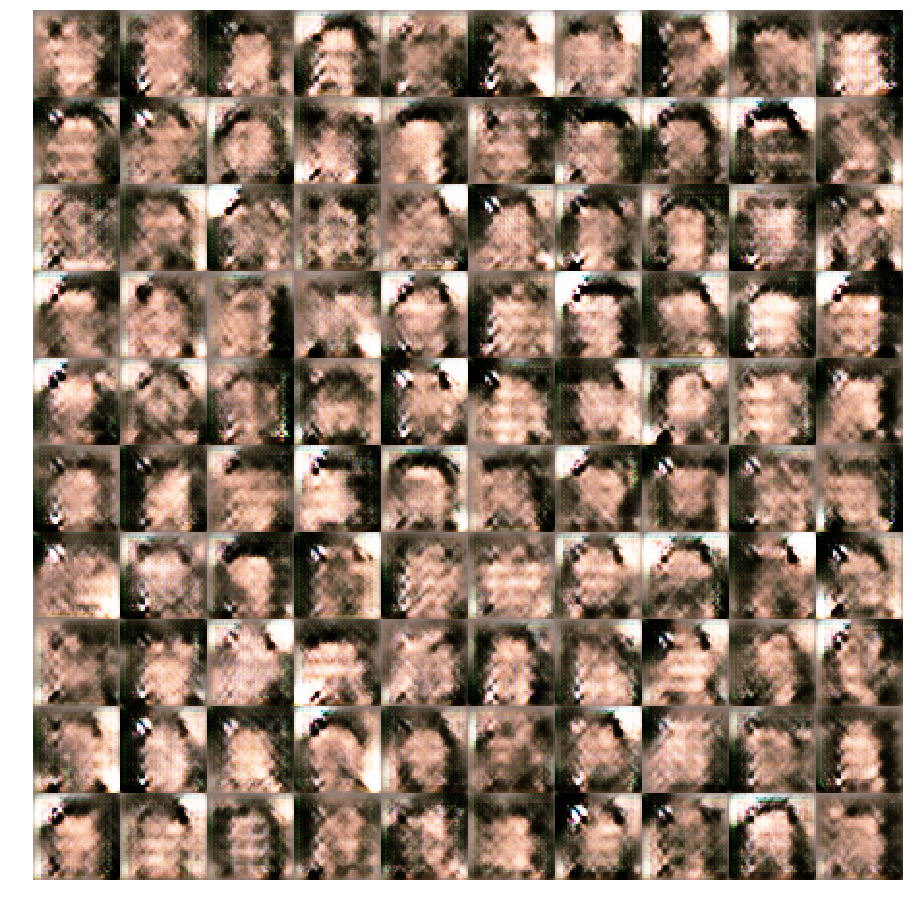

Epoch 6/200:


Training: gen_loss:0.16374 ; gen_acc:33.044% ; disc_loss:0.25218 ; disc_acc:61.074%: 100%|██████████| 6332/6332 [06:43<00:00, 15.68it/s]


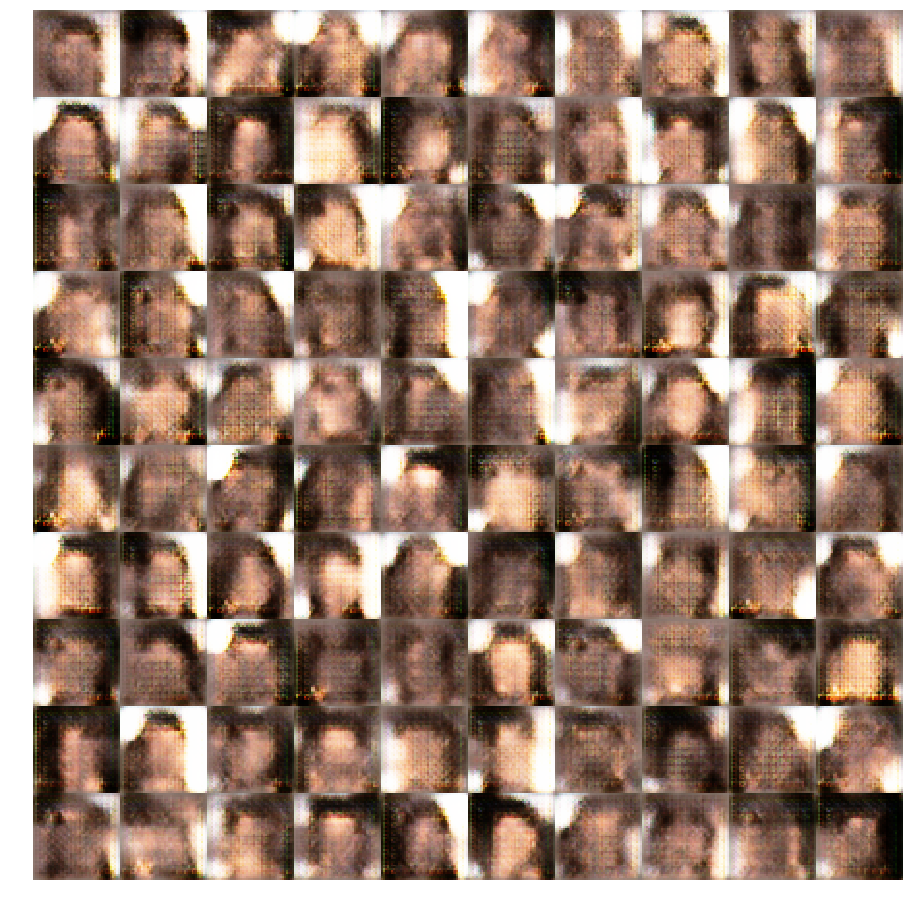

Epoch 7/200:


Training: gen_loss:0.16880 ; gen_acc:32.833% ; disc_loss:0.25101 ; disc_acc:61.669%: 100%|██████████| 6332/6332 [06:43<00:00, 15.70it/s]


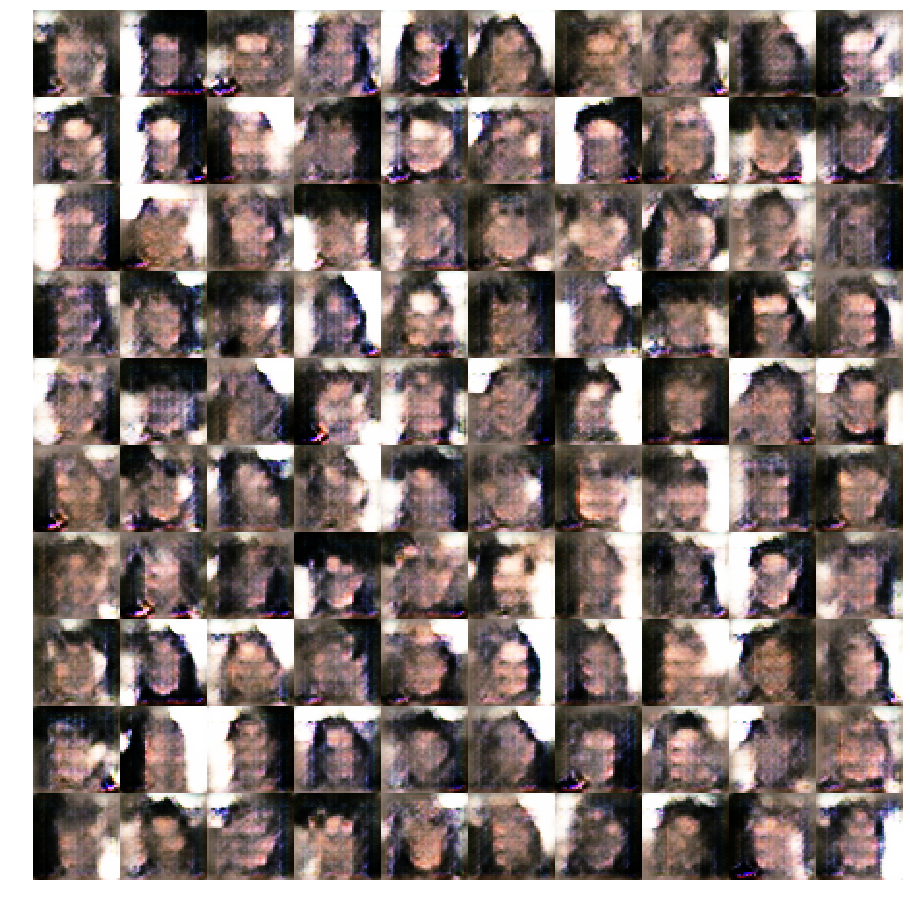

Epoch 8/200:


Training: gen_loss:0.16988 ; gen_acc:31.730% ; disc_loss:0.24991 ; disc_acc:61.638%: 100%|██████████| 6332/6332 [06:43<00:00, 15.70it/s]


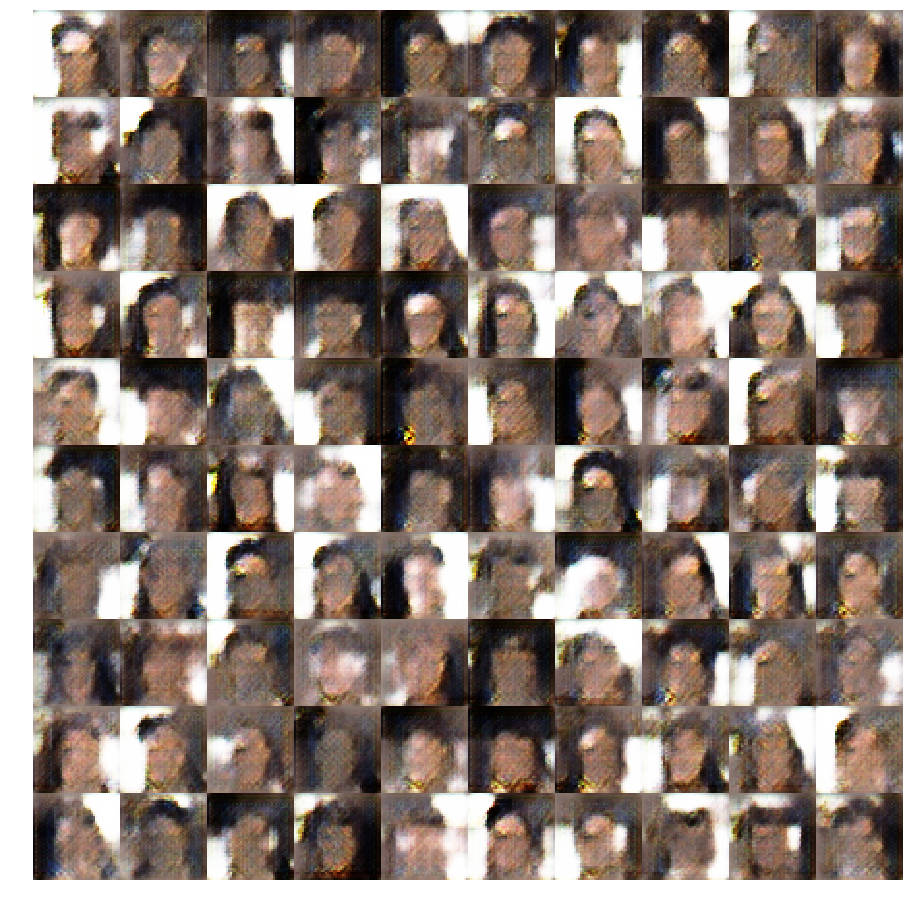

Epoch 9/200:


Training: gen_loss:0.17469 ; gen_acc:29.550% ; disc_loss:0.24551 ; disc_acc:64.022%: 100%|██████████| 6332/6332 [06:43<00:00, 15.70it/s]


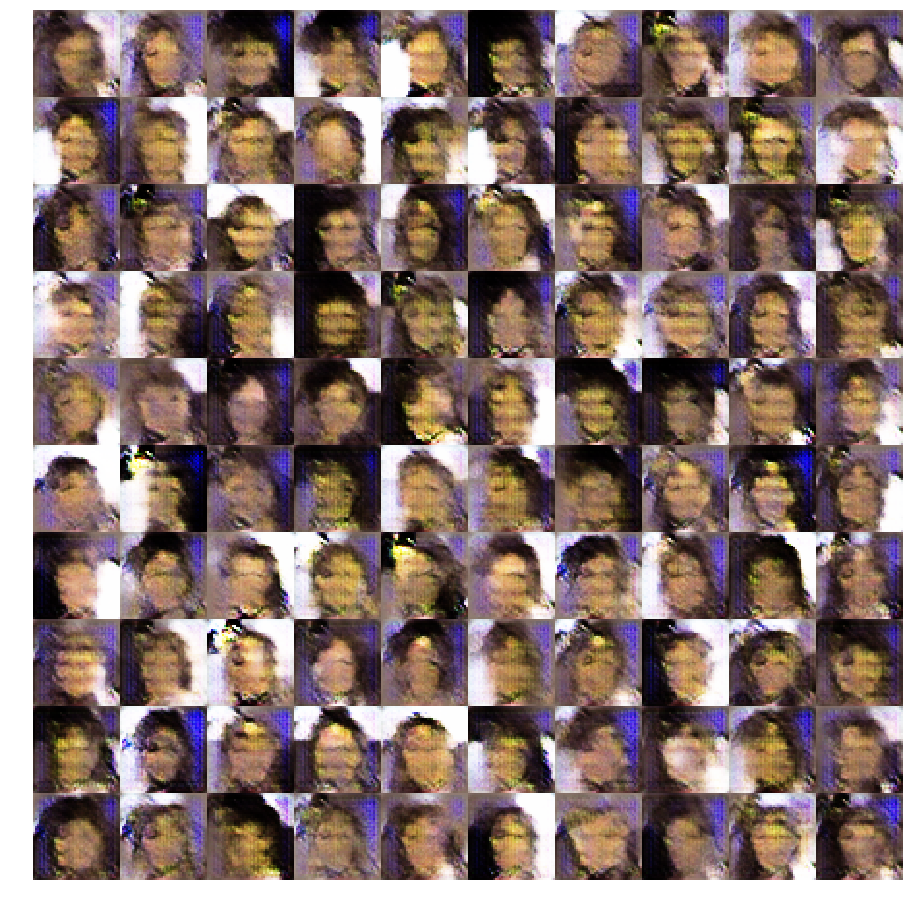

Epoch 10/200:


Training: gen_loss:0.18665 ; gen_acc:23.877% ; disc_loss:0.23539 ; disc_acc:67.376%: 100%|██████████| 6332/6332 [06:44<00:00, 15.65it/s]


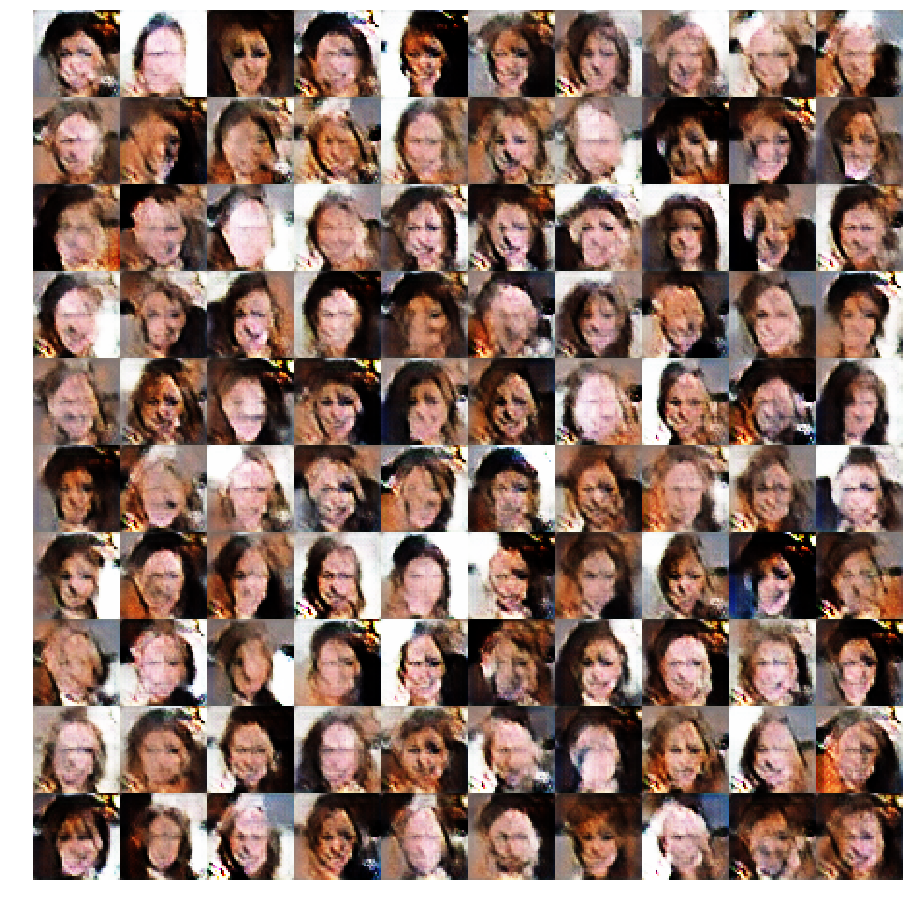

Epoch 11/200:


Training: gen_loss:0.18790 ; gen_acc:22.395% ; disc_loss:0.23373 ; disc_acc:67.951%: 100%|██████████| 6332/6332 [06:44<00:00, 15.66it/s]


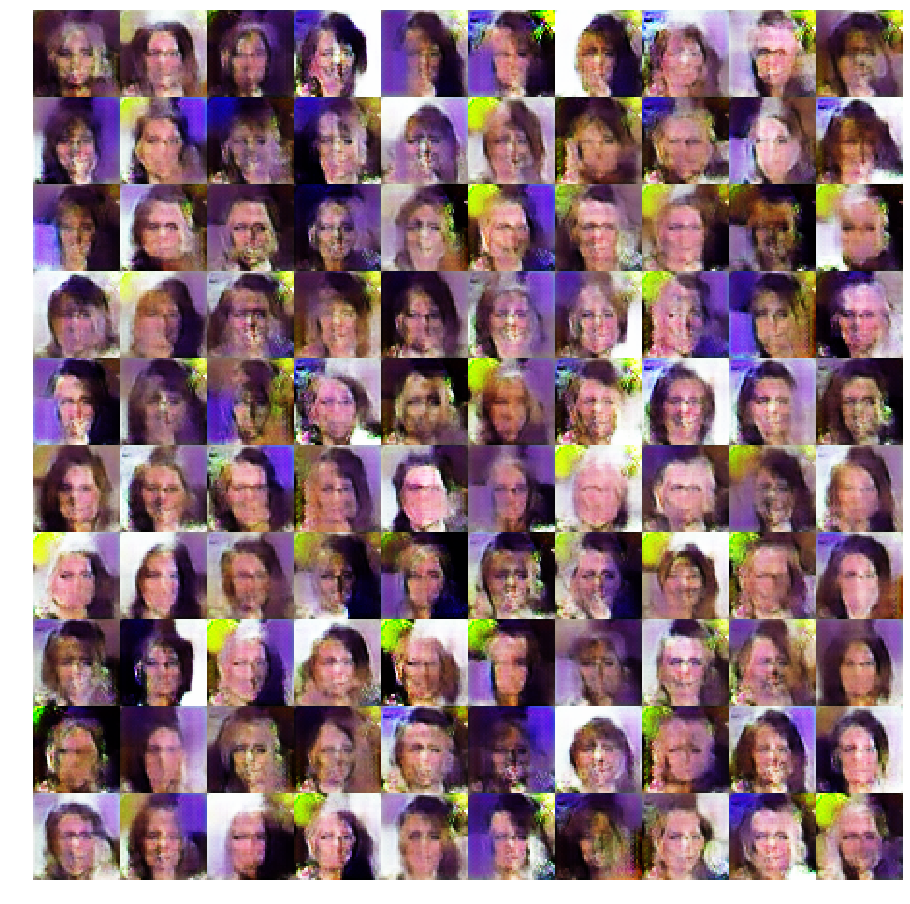

Epoch 12/200:


Training: gen_loss:0.19167 ; gen_acc:19.997% ; disc_loss:0.22747 ; disc_acc:69.327%: 100%|██████████| 6332/6332 [06:44<00:00, 15.67it/s]


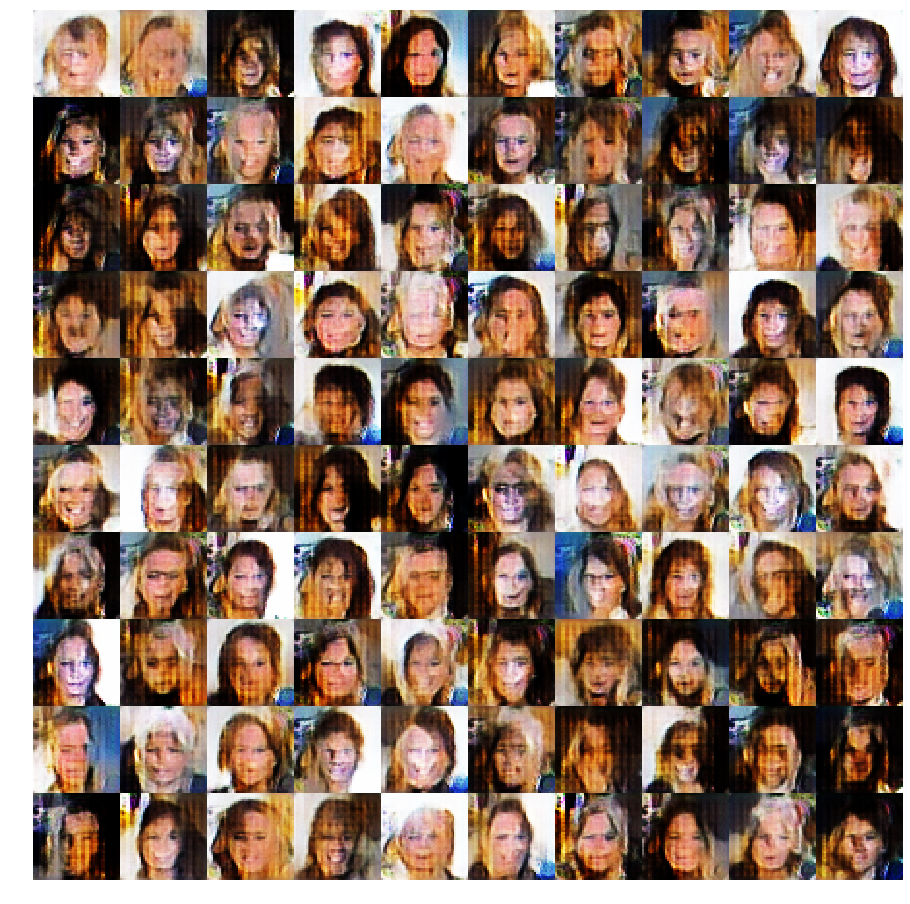

Epoch 13/200:


Training: gen_loss:0.19481 ; gen_acc:19.757% ; disc_loss:0.22742 ; disc_acc:69.299%: 100%|██████████| 6332/6332 [06:43<00:00, 15.68it/s]


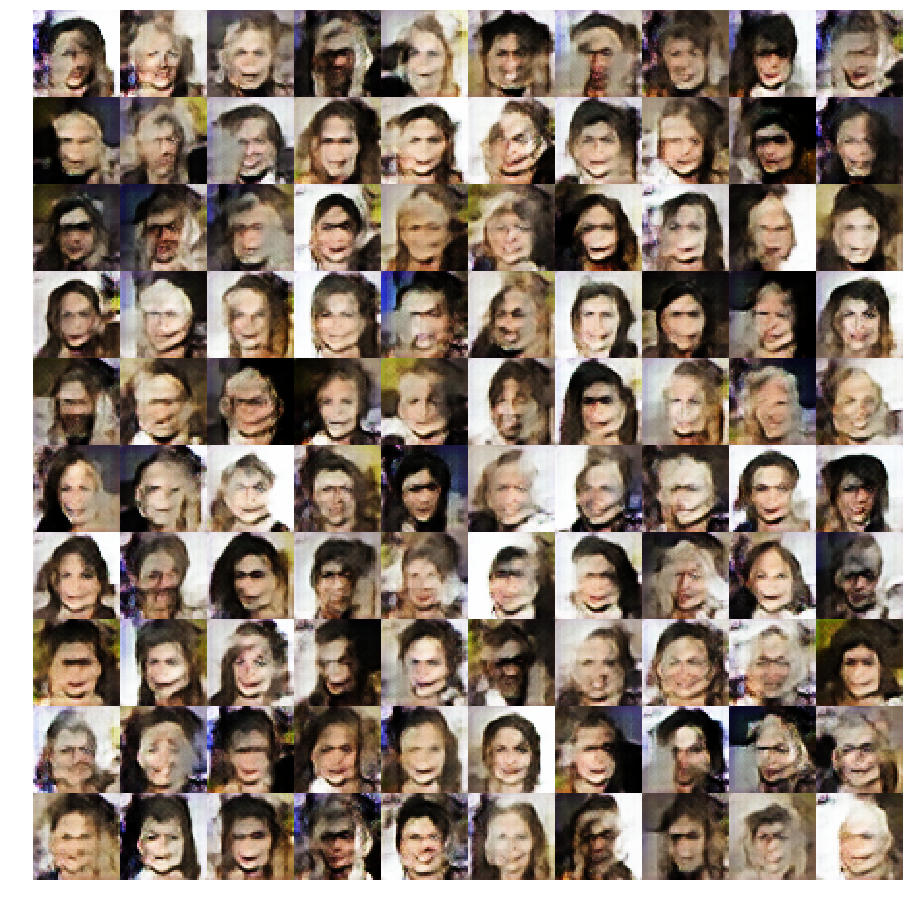

Epoch 14/200:


Training: gen_loss:0.19305 ; gen_acc:19.605% ; disc_loss:0.22561 ; disc_acc:69.666%: 100%|██████████| 6332/6332 [06:44<00:00, 15.65it/s]


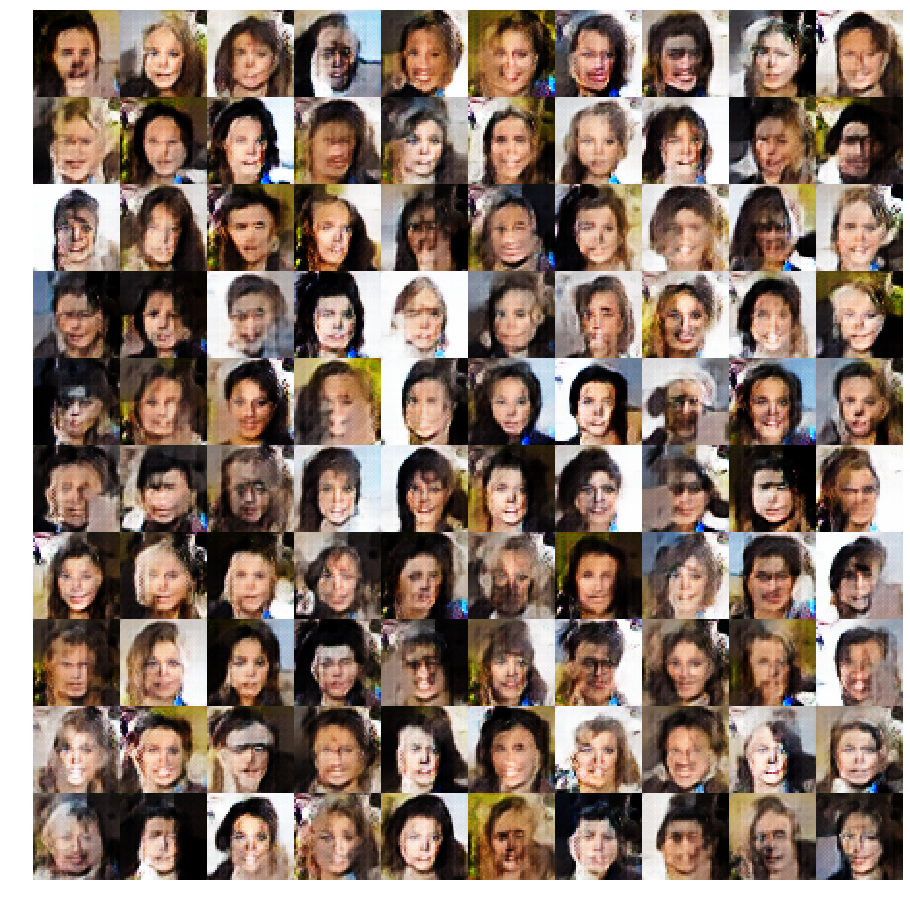

Epoch 15/200:


Training: gen_loss:0.19771 ; gen_acc:18.554% ; disc_loss:0.22162 ; disc_acc:70.970%: 100%|██████████| 6332/6332 [06:45<00:00, 15.61it/s]


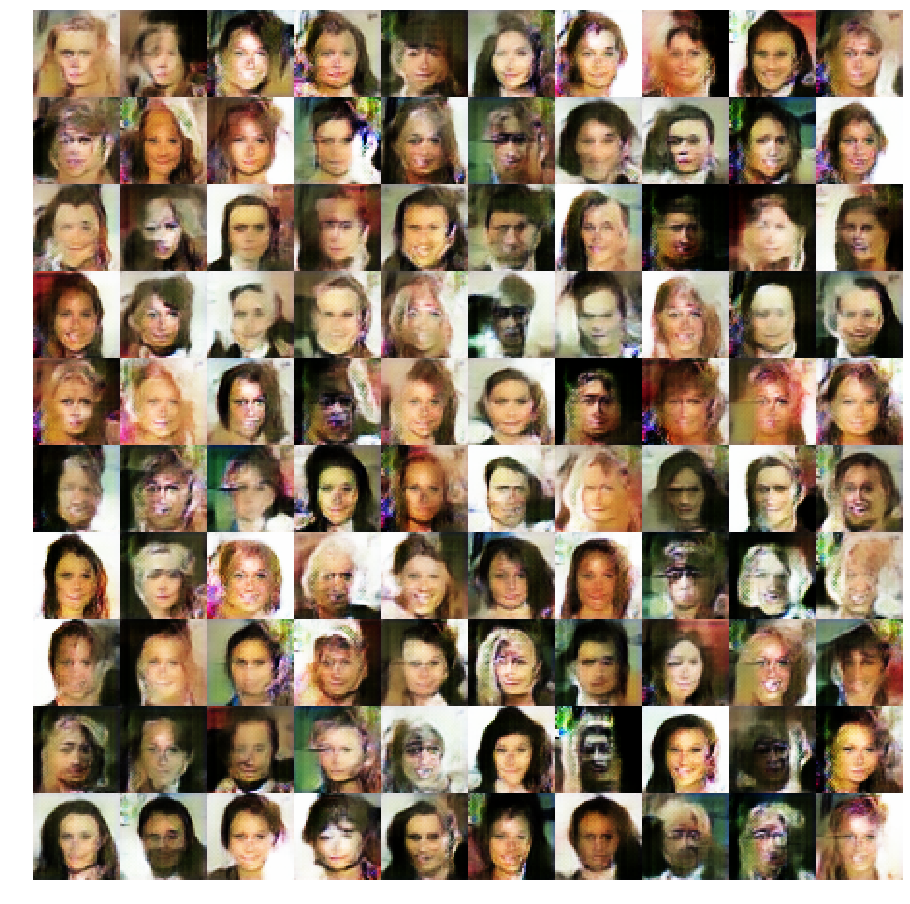

Epoch 16/200:


Training: gen_loss:0.20061 ; gen_acc:17.396% ; disc_loss:0.21927 ; disc_acc:71.358%: 100%|██████████| 6332/6332 [06:46<00:00, 15.58it/s]


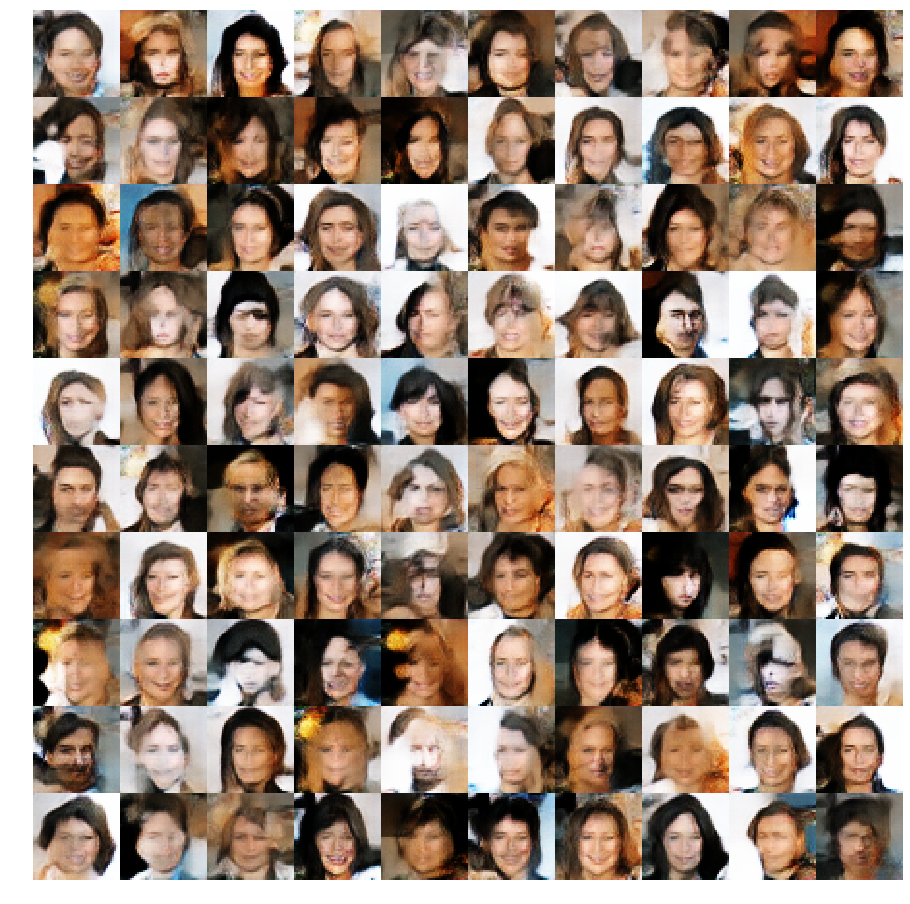

Epoch 17/200:


Training: gen_loss:0.20467 ; gen_acc:16.990% ; disc_loss:0.21650 ; disc_acc:72.053%: 100%|██████████| 6332/6332 [06:45<00:00, 15.61it/s]


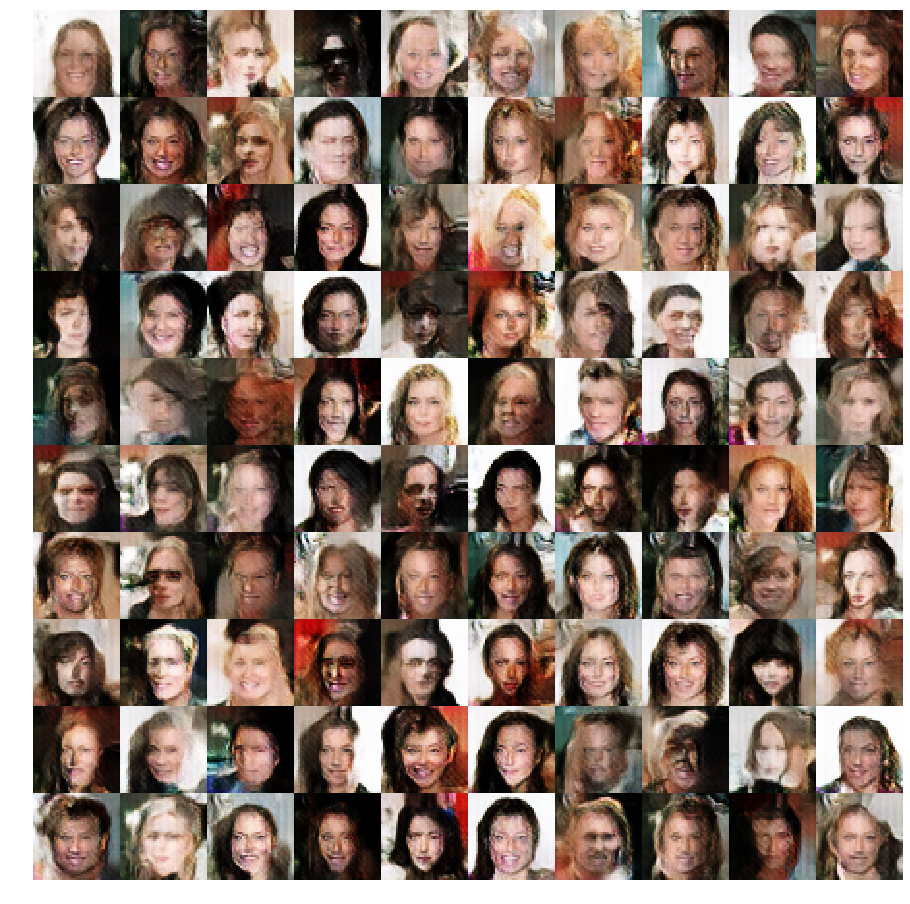

Epoch 18/200:


Training: gen_loss:0.20964 ; gen_acc:16.835% ; disc_loss:0.22143 ; disc_acc:70.960%:   2%|▏         | 99/6332 [00:09<06:31, 15.94it/s]

In [ ]:
training = Training()
training.plot_samples()
training.train(200)

In [ ]:
generator_model.load_weights('generator_weights.h5')
discriminator_model.load_weights('discriminator_weights.h5')

training = Training()
training.plot_samples()
training.train(200)

In [ ]:
generator_model.load_weights('generator_weights.h5')
discriminator_model.load_weights('discriminator_weights.h5')

training = Training()
training.plot_samples()
training.train(200)

In [ ]:
gen_optim.learning_rate.assign(5e-5)
disc_optim.learning_rate.assign(5e-5)

generator_model.load_weights('generator_weights.h5')
discriminator_model.load_weights('discriminator_weights.h5')

training = Training()
training.plot_samples()
training.train(200)

In [ ]:
gen_optim.learning_rate.assign(1e-5)
disc_optim.learning_rate.assign(1e-5)

generator_model.load_weights('generator_weights.h5')
discriminator_model.load_weights('discriminator_weights.h5')

training = Training()
training.plot_samples()
training.train(200)